## Import Helper Function and Parameter

In [1]:
cd("d:/Master Research/Research-Project")

In [2]:
include(joinpath(@__DIR__,"..", "Helper_util", "util.jl"))
include(joinpath(@__DIR__, "..", "Parameter", "parameter.jl"));

┌ Warning: attempting to remove probably stale pidfile
│   path = C:\Users\xiang\.julia\compiled\v1.10\Plots\ld3vC_ZnCEn.ji.pidfile
└ @ FileWatching.Pidfile D:\Julia-1.10.9\share\julia\stdlib\v1.10\FileWatching\src\pidfile.jl:244
┌ Warning: attempting to remove probably stale pidfile
│   path = "C:\\Users\\xiang\\.julia\\compiled\\v1.10\\PlotThemes\\QxsMm_ZnCEn.ji.pidfile"
└ @ FileWatching.Pidfile D:\Julia-1.10.9\share\julia\stdlib\v1.10\FileWatching\src\pidfile.jl:244
┌ Warning: attempting to remove probably stale pidfile
│   path = "C:\\Users\\xiang\\.julia\\compiled\\v1.10\\PlotUtils\\YveHG_ZnCEn.ji.pidfile"
└ @ FileWatching.Pidfile D:\Julia-1.10.9\share\julia\stdlib\v1.10\FileWatching\src\pidfile.jl:244


## Parameter Definition

In [3]:
## Define the diffusion coefficients and wave WaveNumber
diffusion_coefficient = DiffusionParameter(1, 0.0001, 0.001, 0.0001)


total_population=Total_Population(0.4).total


## parameter setting up 2
Nₜ = global_parameter_1.Nₜ
λ, ν = global_parameter_1.λ, global_parameter_1.ν
δ, α, g, m = global_parameter_1.δ, global_parameter_1.α, global_parameter_1.g, global_parameter_1.m
d₁, d₂, d₃, d₄, k = diffusion_coefficient.d₁, diffusion_coefficient.d₂, diffusion_coefficient.d₃, diffusion_coefficient.d₄, WaveNumber(3).k;
d₁_vec=Diffusion_Vec_Parameter(0.1:0.1:10).d_vec;

## Max of real part of PDE v.s. WaveNumber k

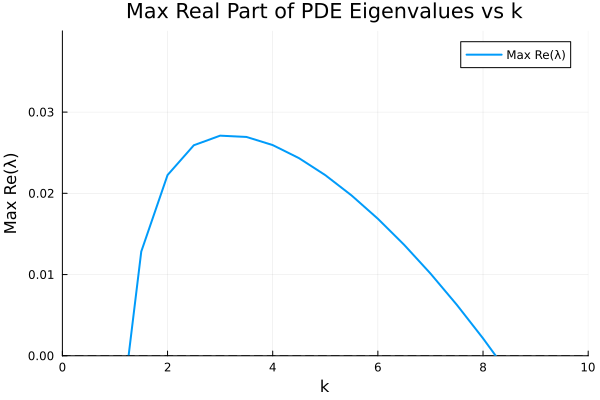

In [ ]:
k_values=0.5:0.5:30
plot_pde_eigenvalues_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k_values, (0, 10), (0, 0.04))

In [6]:
println("ODE MAX eigenvalue: $(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][1])")

ODE MAX eigenvalue: -1.9928847174163255e-14


## Analysis of Characteristic Polynomial Coefficient

In [7]:
function Jacobian_simplication(Nₜ, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)
    N̄,P̄,Z̄,D̄=equilibrium_state_4D(Nₜ, λ, ν, δ, α, g, m)
    result=[]
    for i in 1:length(Nₜ)
        Nᵢ,Pᵢ,Zᵢ, Dᵢ=N̄[i],P̄[i],Z̄[i],D̄[i]
        if Nᵢ == -1 && Pᵢ==-1 && Zᵢ==-1 && Dᵢ==-1
           key=[-0.1, -0.1, -0.1, Nₜ[i]]
        else
           ## Define the Jacobian matrix at equilibrium states
           J=zeros(4,4)
           J=[-ν*Pᵢ/((1+Nᵢ)^2)   -ν*(Nᵢ/(Nᵢ+1))    0      α
              ν*Pᵢ/((1+Nᵢ)^2)    ν*(Nᵢ/(Nᵢ+1))-g*Zᵢ/((1+Pᵢ)^2)-m*λ*Pᵢ^(m-1)  -g*Pᵢ/(1+Pᵢ)    0
              0                  g*Zᵢ/((1+Pᵢ)^2)    0     0
              0                  m*λ*Pᵢ^(m-1)       δ     -α]
           ## define the linear approximation matrix for PDE system
           A=ν*Pᵢ/((1+Nᵢ)^2)
           B=ν*(Nᵢ/(Nᵢ+1))
           C=m*λ*Pᵢ^(m-1) 
           D=g*Zᵢ/((1+Pᵢ)^2)
           E=α
           F=δ
           G=g*Pᵢ/(1+Pᵢ)

           
           key=["A: $(A)", "B: $(B)", "C: $(C)", "D: $(D)", "E: $(E)", "F: $(F)", "G: $(G)", Nₜ[i]]
           
         end
         push!(result,key)
     end
return(result)
end

Jacobian_simplication (generic function with 1 method)

In [8]:
Jacobian_simplication(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1]

8-element Vector{Any}:
  "A: 0.09713411204763982"
  "B: 1.10158524143666"
  "C: 0.053877175130104954"
  "D: 0.9696949981050222"
  "E: 1000.0"
  "F: 0.17"
  "G: 0.17"
 0.4

## Stable Equilibrium

In [4]:
N̄, P̄, Z̄, D̄= equilibrium_state_4D(total_population, λ, ν, δ, α, g, m)
N̄, P̄, Z̄, D̄=N̄[1], P̄[1], Z̄[1], D̄[1]

(0.21324421327576293, 0.024890190336749635, 0.13605433341871628, 0.02581126296877118)

## Initial Condition

In [5]:
function N_initial_cond(x)
    C₁=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][1])
    N = N̄+1e-5*C₁*cos(k*x)
    return(N)
end


function P_initial_cond(x)
    C₂=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][2])
    P = P̄+1e-5*C₂*cos(k*x)
    return(P)
end

function Z_initial_cond(x)
    C₃=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][3])
    Z = Z̄+1e-5*C₃*cos(k*x)
    return(Z)
end

function D_initial_cond(x)
    C₄=real(ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, k)[1][4][4])
    D = D̄ + 1e-5*C₄*cos(k*x)
    return(D)
end

D_initial_cond (generic function with 1 method)

In [21]:
function random_IC_N(x)
    noise = rand(Normal(0, 1e-7))
    return N̄ + noise
end

function random_IC_P(x)
    noise = rand(Normal(0, 1e-7))
    return P̄ + noise
end

function random_IC_Z(x)
    noise = rand(Normal(0, 1e-7))
    return Z̄ + noise
end

function random_IC_D(x)
    noise = rand(Normal(0, 1e-7))
    return D̄ + noise
end

random_IC_D (generic function with 1 method)

## Model setting up

In [22]:
## Initialize the model
NPZD_parameters = ( d₁ = d₁,
                    d₂ = d₂,
                    d₃ = d₃,
                    d₄ = d₄,
                    ν = ν ,          
                    λ = λ ,
                    δ = δ,
                    α = α,
                    g = g,
                    m = m
)



growth_P(z, t, N, P, Z, D, params) = params.ν * P * N / (N + 1)
death_P(z, t, N, P, Z, D, params) = params.λ*(max(0, P))^(params.m)

growth_Z(z, t, N, P, Z, D, params) = params.g * Z * P / (P + 1)
death_Z(z, t, N, P, Z, D, params) = params.δ * Z

growth_N(z, t, N, P, Z, D, params) = params.α * D





N_reaction(z, t, N, P, Z, D, params) = - growth_P(z, t, N, P, Z, D, params) + growth_N(z, t, N, P, Z, D, params)

P_reaction(z, t, N, P, Z, D, params)=   growth_P(z, t, N, P, Z, D, params)- death_P(z, t, N, P, Z, D, params) - growth_Z(z, t, N, P, Z, D, params)

Z_reaction(z, t, N, P, Z, D, params) =  growth_Z(z, t, N, P, Z, D, params) - death_Z(z, t, N, P, Z, D, params)

D_reaction(z, t, N, P, Z, D, params) =  death_P(z, t, N, P, Z, D, params)+ death_Z(z, t, N, P, Z, D, params) - growth_N(z, t, N, P, Z, D, params)



N_forcing = Forcing(N_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
P_forcing = Forcing(P_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
Z_forcing = Forcing(Z_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)
D_forcing = Forcing(D_reaction, field_dependencies = (:N, :P, :Z, :D), parameters = NPZD_parameters)

grid = RectilinearGrid(size=64, z=(0,2*π), topology=(Flat, Flat, Bounded))

diffusivities = NamedTuple{(:N, :P, :Z, :D)}((NPZD_parameters.d₁, NPZD_parameters.d₂, NPZD_parameters.d₃, NPZD_parameters.d₄))

closure = ScalarDiffusivity(κ=diffusivities)

model   = NonhydrostaticModel(; grid,
                             closure,
                             tracers = (:N, :P, :Z, :D),
                             forcing = (N=N_forcing, P=P_forcing, Z=Z_forcing, D=D_forcing)
                             )

NonhydrostaticModel{CPU, RectilinearGrid}(time = 0 seconds, iteration = 0)
├── grid: 1×1×64 RectilinearGrid{Float64, Flat, Flat, Bounded} on CPU with 0×0×3 halo
├── timestepper: RungeKutta3TimeStepper
├── advection scheme: Centered(order=2)
├── tracers: (N, P, Z, D)
├── closure: ScalarDiffusivity{ExplicitTimeDiscretization}(ν=0.0, κ=(N=1.0, P=0.0001, Z=0.001, D=0.0001))
├── buoyancy: Nothing
└── coriolis: Nothing

In [23]:
## Define the initial condition:
set!(model, N = random_IC_N , P = random_IC_P , Z = random_IC_Z, D = random_IC_D)
min_Δz = minimum_zspacing(model.grid)
diffusion_time_scale = min_Δz^2 / model.closure.κ.N;

## Run Simulation

In [24]:
## Running simulation
max_time=170
simulation = Simulation(model, Δt =  0.1 * diffusion_time_scale, stop_time = max_time)

########################################

N, P, Z, D = model.tracers

perturbation_N(args...) = norm(N .- N̄)
perturbation_P(args...) = norm(P .- P̄)
perturbation_Z(args...) = norm(Z .- Z̄)
perturbation_D(args...) = norm(D .- D̄)

simulation.output_writers[:growth_NPZ] =
    NetCDFOutputWriter(model, (; perturbation_N, perturbation_P, perturbation_Z, perturbation_D);
                     filename = "4D_simu_random_parameter_1/NPZDgrowth.nc",
                     schedule = IterationInterval(10),
                     dimensions = (; perturbation_N = (),
                                     perturbation_P = (),
                                     perturbation_Z = (),
                                     perturbation_D = ()),
                     overwrite_existing = true)

simulation.output_writers[:fields] =
    JLD2OutputWriter(model, model.tracers,
                     filename = "4D_simu_random_parameter_1/NPZD.jld2",
                     schedule=IterationInterval(200),
                     overwrite_existing = true)

run!(simulation)

┌ Warning: Overwriting existing d:\Master Research\Research-Project\4D_simu_random_parameter_1\NPZDgrowth.nc.
└ @ Oceananigans.OutputWriters C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\OutputWriters\netcdf_output_writer.jl:397
┌ Info: Initializing simulation...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:202
┌ Info:     ... simulation initialization complete (2.352 seconds)
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:245
┌ Info: Executing initial time step...
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:141
┌ Info:     ... initial time step complete (1.641 seconds).
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o\src\Simulations\run.jl:170
┌ Info: Simulation is stopping after running for 0 seconds.
└ @ Oceananigans.Simulations C:\Users\xiang\.julia\packages\Oceananigans\2NE0o

## Cos(3x)

In [10]:
N_data, P_data, Z_data, D_data, times, space= key_variable_outcome_4D(169, model, "4D_simu_k3_parameter_1/NPZD.jld2");

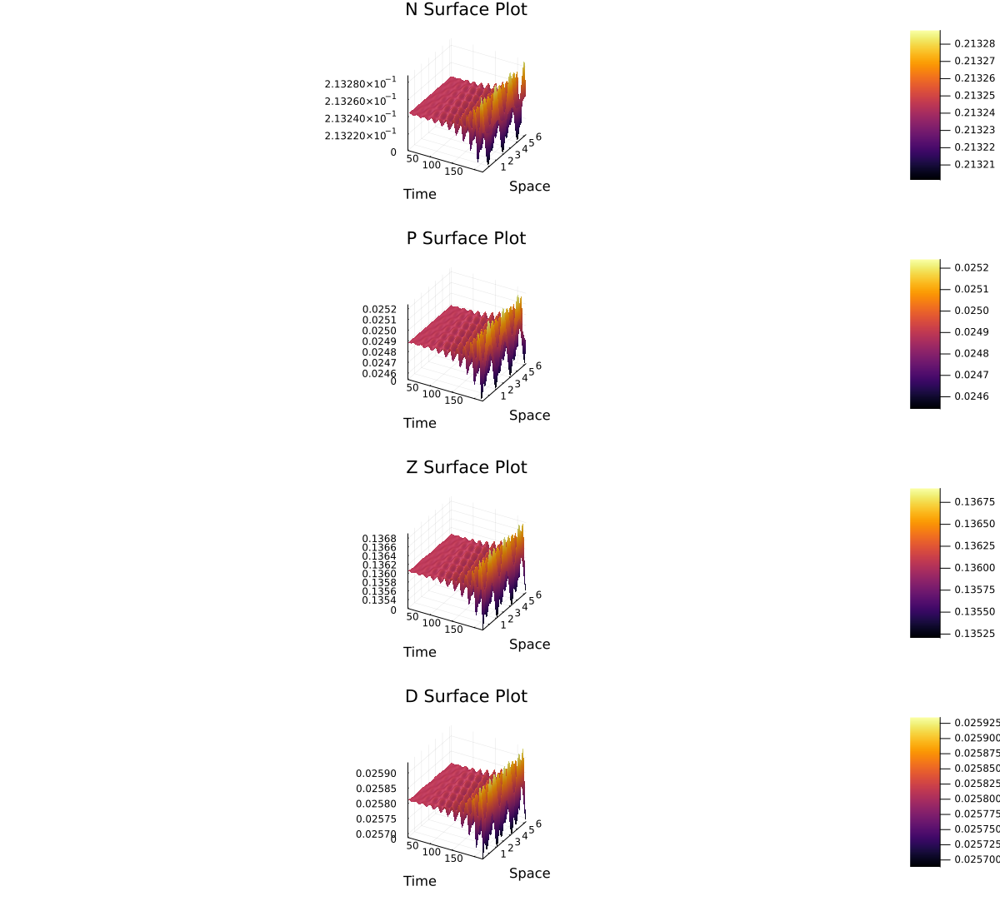

In [11]:
surface_plot_4D(N_data,P_data,Z_data,D_data,times,space)

Growth rate of N is approximately 0.0270915429731314 with oscilation period 16.142200635688713
Growth rate of P is approximately 0.027090145817797364 with oscilation period 16.1441282927906
Growth rate of Z is approximately 0.027088753528422008 with oscilation period 16.14605594991311
Growth rate of D is approximately 0.02709151259188062 with oscilation period 16.14220063569309
Largest real part of e-value 0.02709915024192728

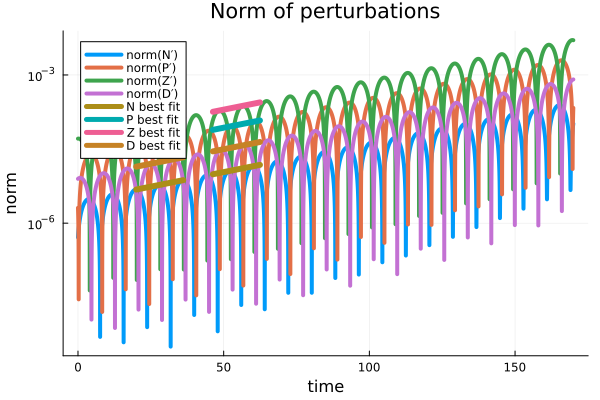

In [12]:
experiment_growth_rate_4D("4D_simu_k3_parameter_1/NPZDgrowth.nc",total_population, 
                          20:70, 
                          20:70, 
                          20:70, 
                          20:70, 
                          λ, ν, δ, g, m, d₁, d₂, d₃, d₄, k)

## Random IC Simulation

In [25]:
N_data, P_data, Z_data, D_data, times, space= key_variable_outcome_4D(169, model, "4D_simu_random_parameter_1/NPZD.jld2");

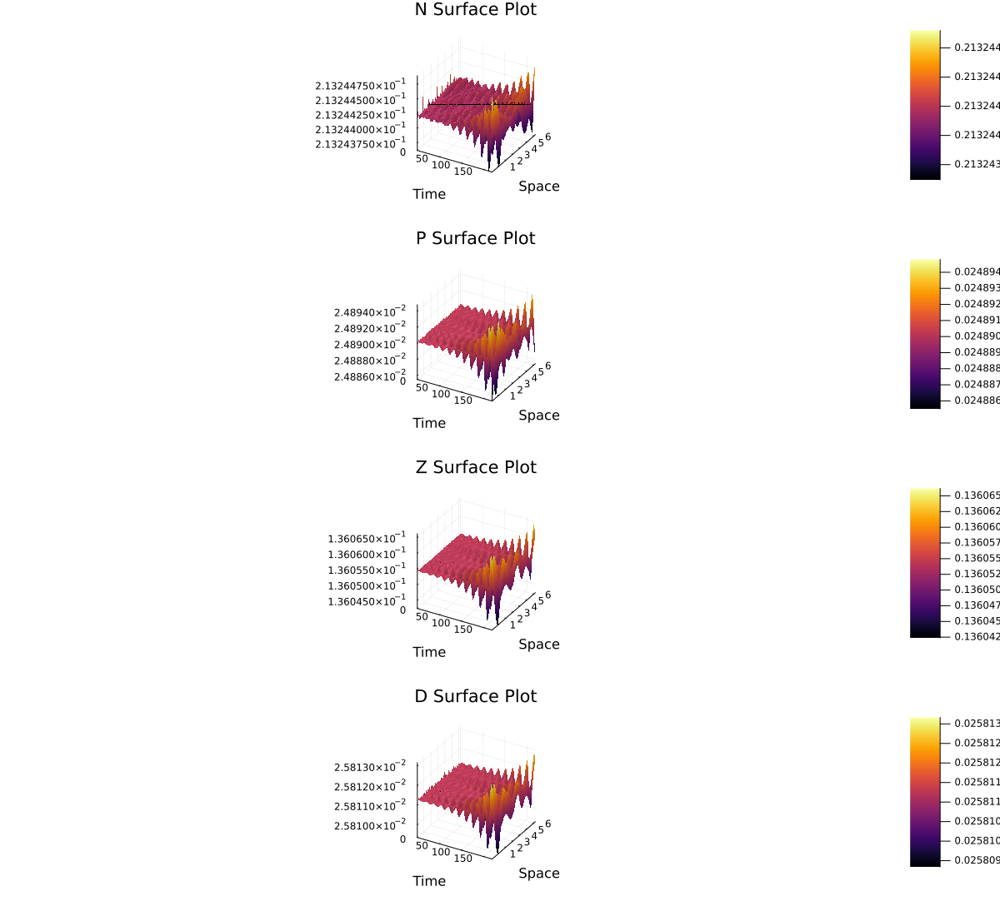

In [26]:
surface_plot_4D(N_data,P_data,Z_data,D_data,times,space)

Growth rate of N is approximately 0.021230228112226357 with oscilation period 16.234728176848023
Growth rate of P is approximately 0.02496177850982857 with oscilation period 16.153766578245836
Growth rate of Z is approximately 0.025070956980911722 with oscilation period 16.153766578245836
Growth rate of D is approximately 0.024943896963433437 with oscilation period 16.153766578245836
Largest real part of e-value 0.02709915024192728

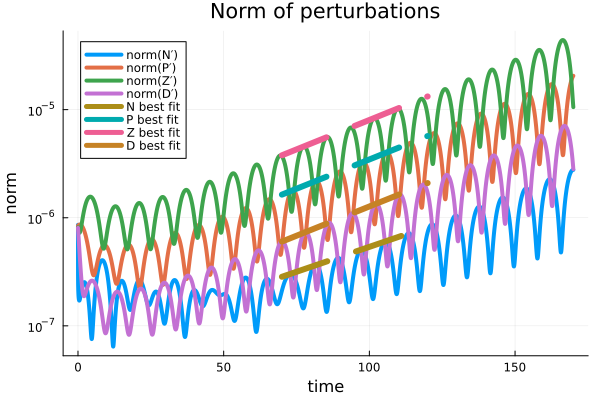

In [27]:
experiment_growth_rate_4D("4D_simu_random_parameter_1/NPZDgrowth.nc",total_population, 
                          70:120, 
                          70:120, 
                          70:120, 
                          70:120, 
                          λ, ν, δ, g, m, d₁, d₂, d₃, d₄, k)

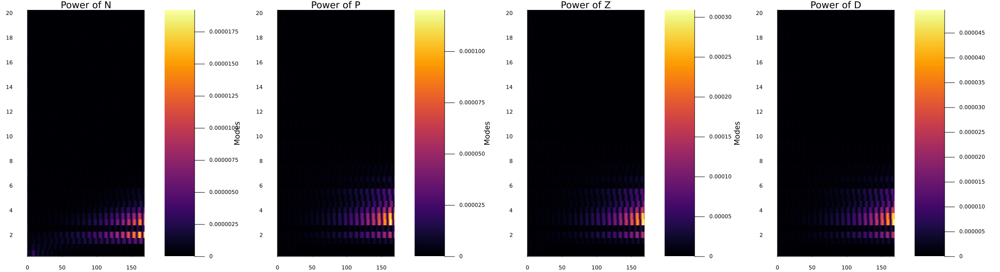

In [28]:
FFT_power_4D(N_data, P_data, Z_data, D_data, N̄, P̄, Z̄, D̄, times)

In [23]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 1.5)[1][5]

0.015596380538465137 - 0.4009321955306985im

In [24]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 2)[1][5]

0.02419078554538759 - 0.40142174538460057im

In [25]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 3)[1][5]

0.02841731813736606 - 0.40235398459959576im

In [26]:
ODE_PDE_system_4D(total_population, λ, ν, δ, α, g, m, d₁, d₂, d₃, d₄, 3.5)[1][5]

0.02812213370532446 - 0.40252957886424745im